# Loading dataset from Kaggle

In [ ]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! cp kaggle.json ~/.kaggle/

Using kaggle.json file to authenticate api connection.

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d pythonafroz/solar-power

  0% 0.00/1.90M [00:00<?, ?B/s]
100% 1.90M/1.90M [00:00<00:00, 120MB/s]


Unzipping dataset downloaded.

In [ ]:
! unzip /content/solar-power.zip

Archive:  /content/solar-power.zip
  inflating: Plant_1_Generation_Data.csv  
  inflating: Plant_1_Weather_Sensor_Data.csv  
  inflating: Plant_2_Generation_Data.csv  
  inflating: Plant_2_Weather_Sensor_Data.csv  


# Loading important libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.dates as mdates
xformatter = mdates.DateFormatter('%H:%M') # for time axis plots

# import plotly.offline as py
# py.init_notebook_mode(connected=True)


import sklearn
from scipy.optimize import curve_fit

import warnings
warnings.filterwarnings('ignore')

In [ ]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)


# Loading all the data

In [ ]:
generation_data_plant1 = pd.read_csv('/content/Plant_1_Generation_Data.csv')
generation_data_plant1.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,15-05-2020 00:00,4135001,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0
1,15-05-2020 00:00,4135001,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0
2,15-05-2020 00:00,4135001,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0
3,15-05-2020 00:00,4135001,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0
4,15-05-2020 00:00,4135001,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0


Using describe() to understan the general stats of the data present.

In [ ]:
generation_data_plant1.describe()

,PLANT_ID,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
count,68778.0,68778.000000,68778.000000,68778.000000,6.877800e+04
mean,4135001.0,3147.426211,307.802752,3295.968737,6.978712e+06
std,0.0,4036.457169,394.396439,3145.178309,4.162720e+05
min,4135001.0,0.000000,0.000000,0.000000,6.183645e+06
25%,4135001.0,0.000000,0.000000,0.000000,6.512003e+06
50%,4135001.0,429.000000,41.493750,2658.714286,7.146685e+06
75%,4135001.0,6366.964286,623.618750,6274.000000,7.268706e+06
max,4135001.0,14471.125000,1410.950000,9163.000000,7.846821e+06


In [ ]:
generation_data_plant1.dtypes

DATE_TIME       object
PLANT_ID         int64
SOURCE_KEY      object
DC_POWER       float64
AC_POWER       float64
DAILY_YIELD    float64
TOTAL_YIELD    float64
dtype: object

In [ ]:
weather_data_plant1 = pd.read_csv('/content/Plant_1_Weather_Sensor_Data.csv')
weather_data_plant1.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4135001,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0
1,2020-05-15 00:15:00,4135001,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0
2,2020-05-15 00:30:00,4135001,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0
3,2020-05-15 00:45:00,4135001,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0
4,2020-05-15 01:00:00,4135001,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0


In [ ]:
weather_data_plant1.describe()

,PLANT_ID,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
count,3182.0,3182.000000,3182.000000,3182.000000
mean,4135001.0,25.531606,31.091015,0.228313
std,0.0,3.354856,12.261222,0.300836
min,4135001.0,20.398505,18.140415,0.000000
25%,4135001.0,22.705182,21.090553,0.000000
50%,4135001.0,24.613814,24.618060,0.024653
75%,4135001.0,27.920532,41.307840,0.449588
max,4135001.0,35.252486,65.545714,1.221652


In [ ]:
weather_data_plant1.dtypes

DATE_TIME               object
PLANT_ID                 int64
SOURCE_KEY              object
AMBIENT_TEMPERATURE    float64
MODULE_TEMPERATURE     float64
IRRADIATION            float64
dtype: object

In [ ]:
generation_data_plant2 = pd.read_csv('/content/Plant_2_Generation_Data.csv')
generation_data_plant2.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,2020-05-15 00:00:00,4136001,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06
1,2020-05-15 00:00:00,4136001,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09
2,2020-05-15 00:00:00,4136001,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09
3,2020-05-15 00:00:00,4136001,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06
4,2020-05-15 00:00:00,4136001,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07


In [ ]:
generation_data_plant2.describe()

,PLANT_ID,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
count,67698.0,67698.000000,67698.000000,67698.000000,6.769800e+04
mean,4136001.0,246.701961,241.277825,3294.890295,6.589448e+08
std,0.0,370.569597,362.112118,2919.448386,7.296678e+08
min,4136001.0,0.000000,0.000000,0.000000,0.000000e+00
25%,4136001.0,0.000000,0.000000,272.750000,1.996494e+07
50%,4136001.0,0.000000,0.000000,2911.000000,2.826276e+08
75%,4136001.0,446.591667,438.215000,5534.000000,1.348495e+09
max,4136001.0,1420.933333,1385.420000,9873.000000,2.247916e+09


In [ ]:
weather_data_plant2 = pd.read_csv('/content/Plant_2_Weather_Sensor_Data.csv')
weather_data_plant2.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4136001,iq8k7ZNt4Mwm3w0,27.004764,25.060789,0.0
1,2020-05-15 00:15:00,4136001,iq8k7ZNt4Mwm3w0,26.880811,24.421869,0.0
2,2020-05-15 00:30:00,4136001,iq8k7ZNt4Mwm3w0,26.682055,24.427290,0.0
3,2020-05-15 00:45:00,4136001,iq8k7ZNt4Mwm3w0,26.500589,24.420678,0.0
4,2020-05-15 01:00:00,4136001,iq8k7ZNt4Mwm3w0,26.596148,25.088210,0.0


In [ ]:
weather_data_plant2.describe()

,PLANT_ID,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
count,3259.0,3259.000000,3259.000000,3259.000000
mean,4136001.0,28.069400,32.772408,0.232737
std,0.0,4.061556,11.344034,0.312693
min,4136001.0,20.942385,20.265123,0.000000
25%,4136001.0,24.602135,23.716881,0.000000
50%,4136001.0,26.981263,27.534606,0.019040
75%,4136001.0,31.056757,40.480653,0.438717
max,4136001.0,39.181638,66.635953,1.098766


# Data Cleaning

Checking null values

In [ ]:
generation_data_plant1.isnull().sum().sort_values(ascending=False)

DATE_TIME      0
PLANT_ID       0
SOURCE_KEY     0
DC_POWER       0
AC_POWER       0
DAILY_YIELD    0
TOTAL_YIELD    0
dtype: int64

In [ ]:
generation_data_plant2.isnull().sum().sort_values(ascending=False)

DATE_TIME      0
PLANT_ID       0
SOURCE_KEY     0
DC_POWER       0
AC_POWER       0
DAILY_YIELD    0
TOTAL_YIELD    0
dtype: int64

In [ ]:
weather_data_plant1.isnull().sum().sort_values(ascending=False)

DATE_TIME              0
PLANT_ID               0
SOURCE_KEY             0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
dtype: int64

In [ ]:
weather_data_plant2.isnull().sum().sort_values(ascending=False)

DATE_TIME              0
PLANT_ID               0
SOURCE_KEY             0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
dtype: int64

To verify key column is unique.

In [ ]:
weather_data_plant1['PLANT_ID'].nunique()

1

In [ ]:
generation_data_plant2['PLANT_ID'].nunique()

1

# Data Transformation

We observed the common column is date_time and plant_id.
However, the reading are taken at every 15 minutes of the day. Thus, data can be merged on date/time to display weather's data and sensor's data at that particular time.

Converting all the values in the same format.

In [ ]:
generation_data_plant1['DATE_TIME'] = pd.to_datetime(generation_data_plant1['DATE_TIME'],format = '%d-%m-%Y %H:%M')
weather_data_plant1['DATE_TIME'] = pd.to_datetime(weather_data_plant1['DATE_TIME'],format = '%Y-%m-%d %H:%M:%S')

In [ ]:
generation_data_plant2['DATE_TIME'] = pd.to_datetime(generation_data_plant1['DATE_TIME'],format = '%d-%m-%Y %H:%M')
weather_data_plant2['DATE_TIME'] = pd.to_datetime(weather_data_plant1['DATE_TIME'],format = '%Y-%m-%d %H:%M:%S')

In [ ]:
df_solar1 = pd.merge(generation_data_plant1.drop(columns = ['PLANT_ID']), weather_data_plant1.drop(columns = ['PLANT_ID', 'SOURCE_KEY']), on='DATE_TIME')

In [ ]:
df_solar1.isnull().sum().sort_values(ascending=False)

DATE_TIME              0
SOURCE_KEY             0
DC_POWER               0
AC_POWER               0
DAILY_YIELD            0
TOTAL_YIELD            0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
dtype: int64

In [ ]:
sensorkeys = df_solar1.SOURCE_KEY.unique().tolist() # unique sensor keys
sensornumbers = list(range(1,len(sensorkeys)+1)) # sensor number
dict_sensor = dict(zip(sensorkeys, sensornumbers)) # dictionary of sensor numbers and corresponding keys

# add column
df_solar1['SENSOR_NUM'] = 0
for i in range(generation_data_plant1.shape[0]):
    df_solar1['SENSOR_NUM'][i] = dict_sensor[generation_data_plant1["SOURCE_KEY"][i]]

# add Sensor Number as string
df_solar1["SENSOR_NAME"] = df_solar1["SENSOR_NUM"].apply(str)

In [ ]:
df_solar1["DATE"] = pd.to_datetime(df_solar1["DATE_TIME"]).dt.date # add new column with date
df_solar1["TIME"] = pd.to_datetime(df_solar1["DATE_TIME"]).dt.time # add new column with time

# add hours and minutes for ml models
df_solar1['HOURS'] = pd.to_datetime(df_solar1['TIME'],format='%H:%M:%S').dt.hour
df_solar1['MINUTES'] = pd.to_datetime(df_solar1['TIME'],format='%H:%M:%S').dt.minute
df_solar1['MINUTES_PASS'] = df_solar1['MINUTES'] + df_solar1['HOURS']*60

# add date as string column
df_solar1["DATE_STR"] = df_solar1["DATE"].astype(str)

In [ ]:
# final dataset
df_solar1.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR
0,2020-05-15,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,1,1,2020-05-15,00:00:00,0,0,0,2020-05-15
1,2020-05-15,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2,2,2020-05-15,00:00:00,0,0,0,2020-05-15
2,2020-05-15,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,3,3,2020-05-15,00:00:00,0,0,0,2020-05-15
3,2020-05-15,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,4,4,2020-05-15,00:00:00,0,0,0,2020-05-15
4,2020-05-15,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0,5,5,2020-05-15,00:00:00,0,0,0,2020-05-15


# Exploratory Data Analysis

Understanding corelation between all the columns using pair plot.

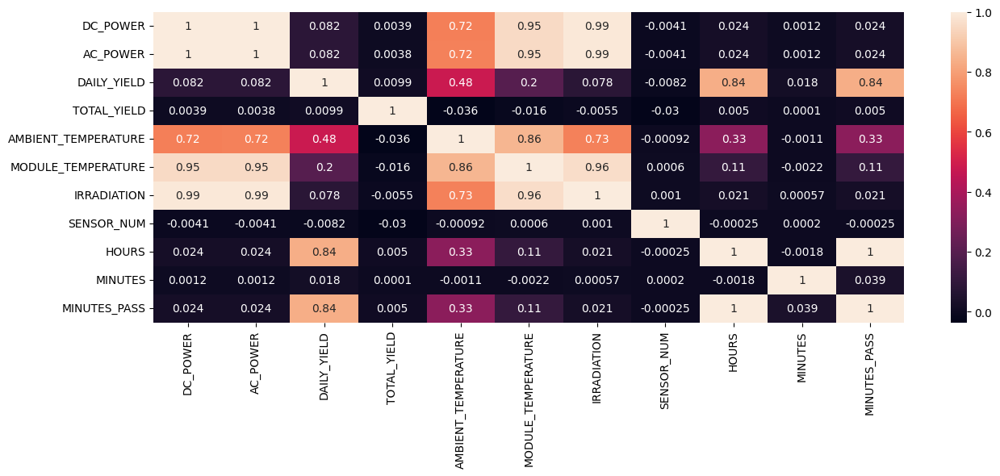

In [ ]:
cols_corr = ["DC_POWER", "AC_POWER", "DAILY_YIELD", "TOTAL_YIELD", "AMBIENT_TEMPERATURE", "MODULE_TEMPERATURE", "IRRADIATION", "SENSOR_NUM", "HOURS", "MINUTES", "MINUTES_PASS"]
corrMatrix = df_solar1[cols_corr].corr()
plt.figure(figsize=(15,5))
fig_corr = sns.heatmap(corrMatrix, annot=True)
plt.show()

Analysing corelation between each column pairs to identify outliers as well.

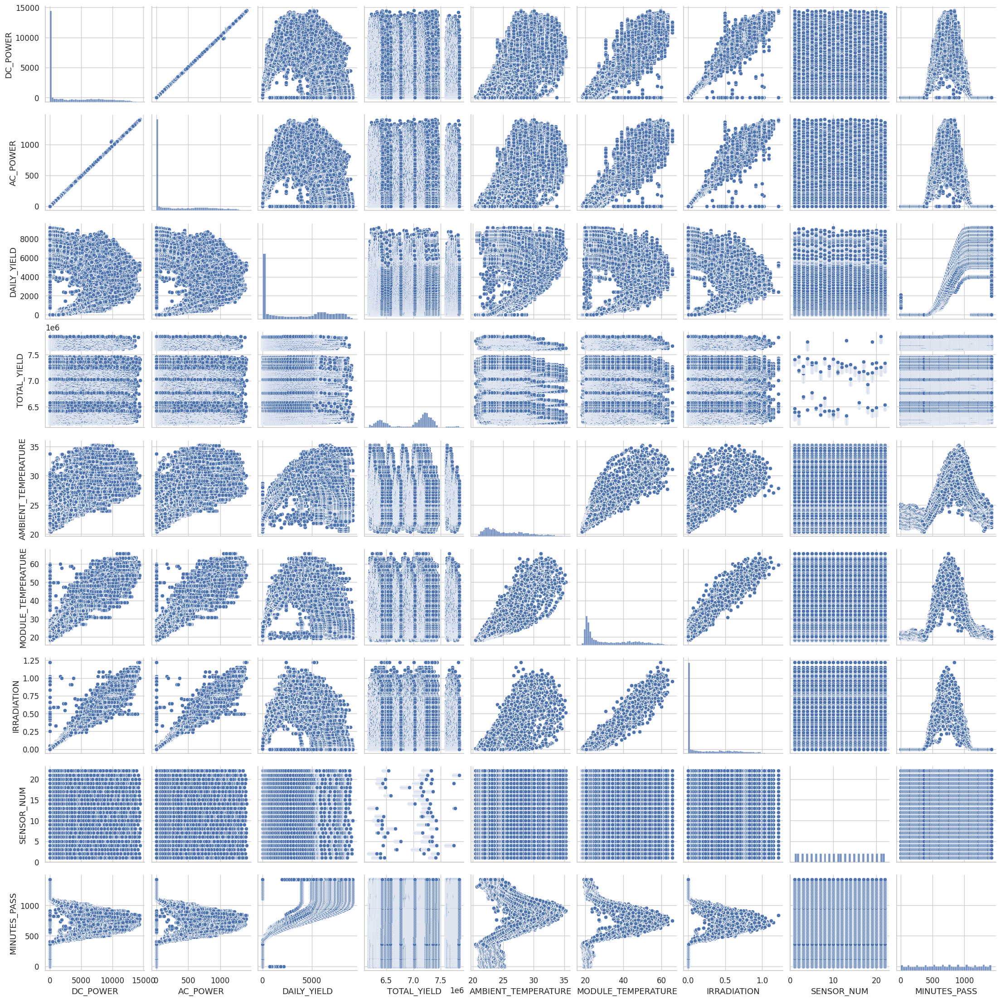

In [ ]:
sns.set(style='whitegrid', font_scale=1.1, rc={"figure.figsize": [15, 5]})
cols_pair = ["DC_POWER", "AC_POWER", "DAILY_YIELD", "TOTAL_YIELD", "AMBIENT_TEMPERATURE", "MODULE_TEMPERATURE", "IRRADIATION", "SENSOR_NUM", "MINUTES_PASS"]
fig_pair = sns.pairplot(df_solar1[cols_pair])
plt.show()

We observed in the above graphs that Irridiation, DC power and AC power have strong correlation.

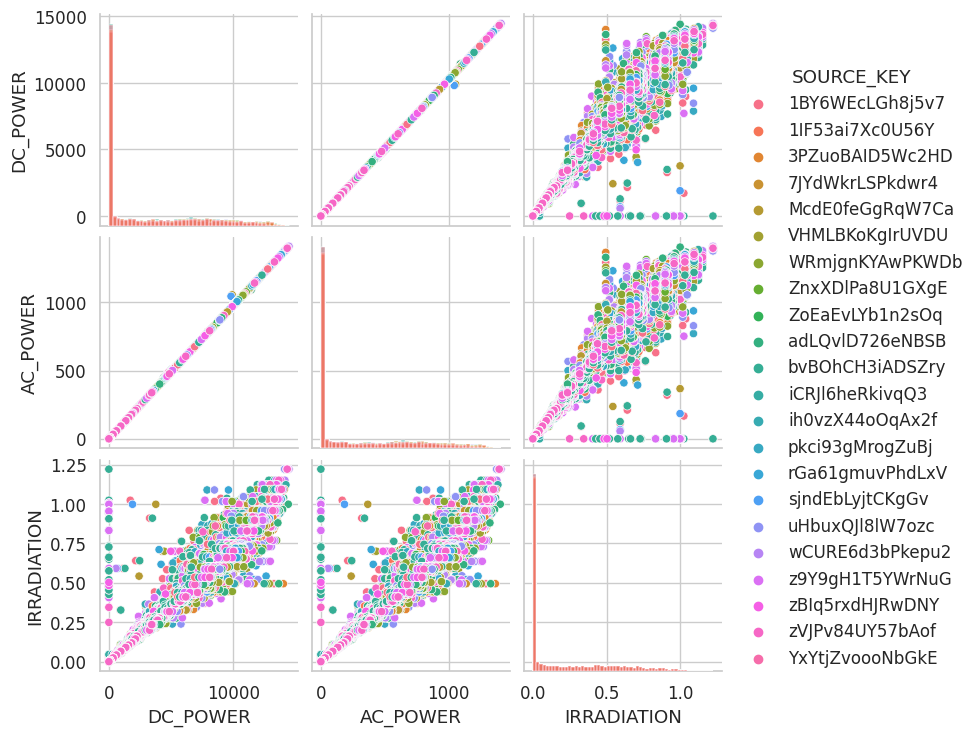

In [ ]:
cols_out = ["DC_POWER", "AC_POWER", "IRRADIATION", "SOURCE_KEY"]
sns.pairplot(df_solar1[cols_out], hue="SOURCE_KEY", diag_kind="hist")
plt.show()

AC vs DC Power

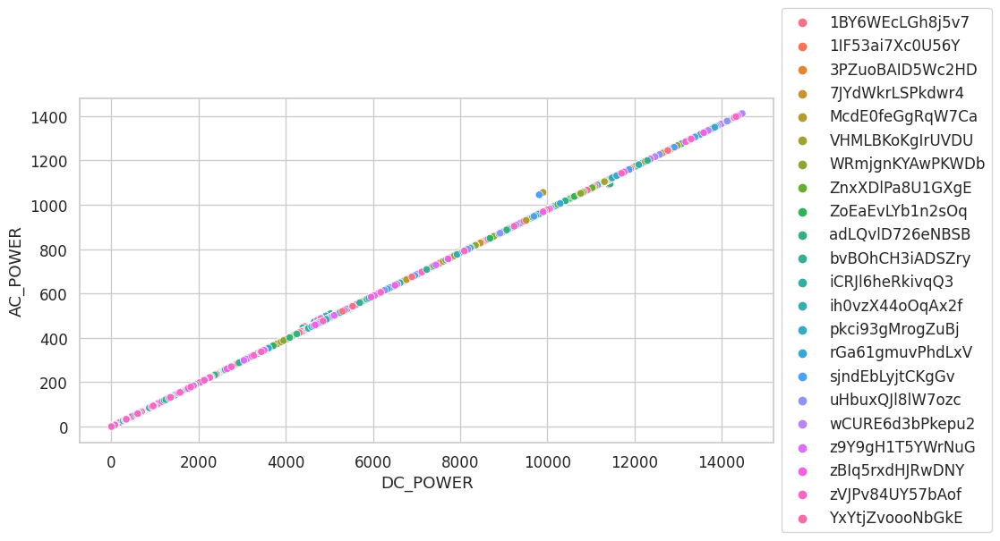

In [ ]:
plt.figure(figsize=(10,5))
fig_power = sns.scatterplot(data=df_solar1, x="DC_POWER", y="AC_POWER", hue="SOURCE_KEY")
fig_power.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.show()

Power Vs Temprature

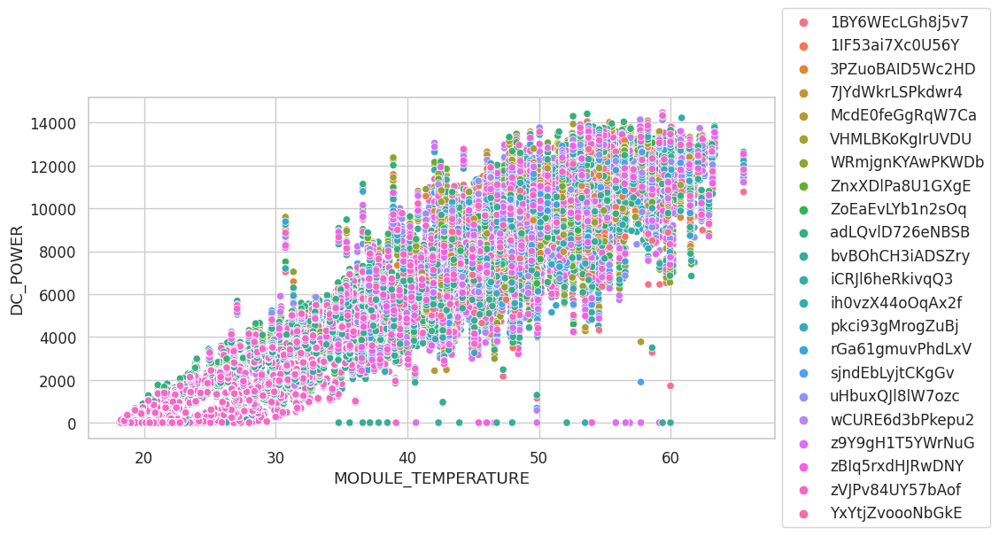

In [ ]:
plt.figure(figsize=(10,5))
fig_temp = sns.scatterplot(data=df_solar1, x="MODULE_TEMPERATURE", y="DC_POWER", hue="SOURCE_KEY")
fig_temp.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.show()

Power vs Irradiation

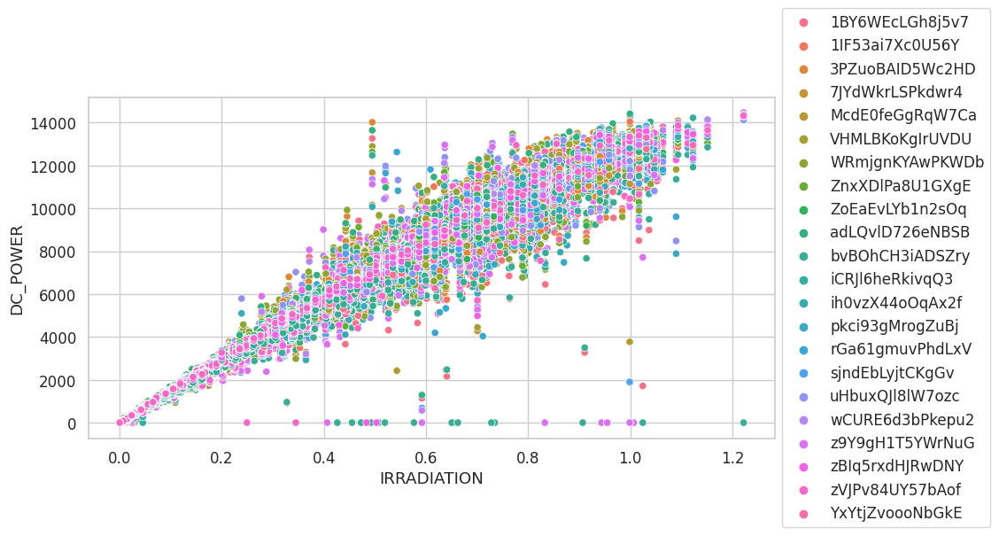

In [ ]:
plt.figure(figsize=(10,5))
fig_irr = sns.scatterplot(data=df_solar1, x="IRRADIATION", y="DC_POWER", hue="SOURCE_KEY")
fig_irr.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.show()

DC power distribution to analyse power generation through various days.

In [ ]:
fig = px.scatter(df_solar1, x="TIME", y="DC_POWER", title="DC Power: Daily Distribution", color = "DATE_STR")
fig.update_traces(marker=dict(size=5, opacity=0.7), selector=dict(mode='markers'))
fig.show()

Irradiation occurring through various days

In [ ]:
fig = px.scatter(df_solar1, x="TIME", y="IRRADIATION", title="Irradiation: Daily Distribution", color = "DATE_STR")
fig.update_traces(marker=dict(size=5, opacity=0.7), selector=dict(mode='markers'))
fig.show()

Temprature at a particular date

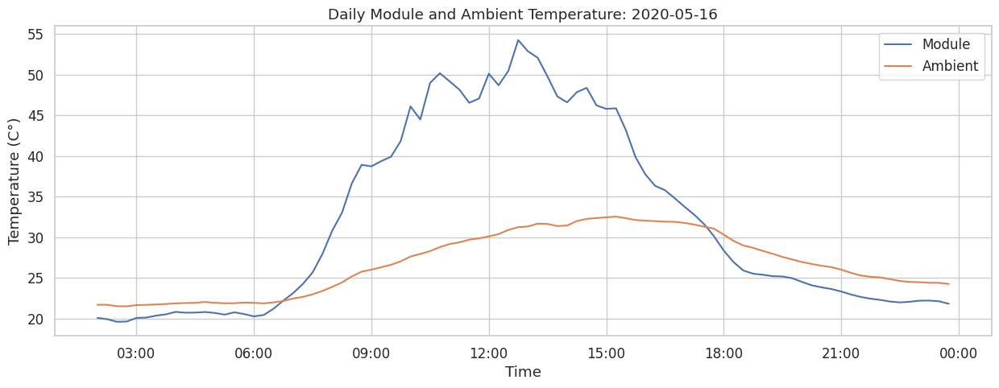

In [ ]:
date=["2020-05-16"]
plt.plot(df_solar1[df_solar1["DATE_STR"].isin(date)].DATE_TIME, df_solar1[df_solar1["DATE_STR"].isin(date)].MODULE_TEMPERATURE, label="Module")
plt.plot(df_solar1[df_solar1["DATE_STR"].isin(date)].DATE_TIME, df_solar1[df_solar1["DATE_STR"].isin(date)].AMBIENT_TEMPERATURE, label="Ambient")
plt.gcf().axes[0].xaxis.set_major_formatter(xformatter) # set xaxis format
plt.legend()
plt.title("Daily Module and Ambient Temperature: {}" .format(date[0]))
plt.xlabel("Time")
plt.ylabel("Temperature (C°)")
plt.show()

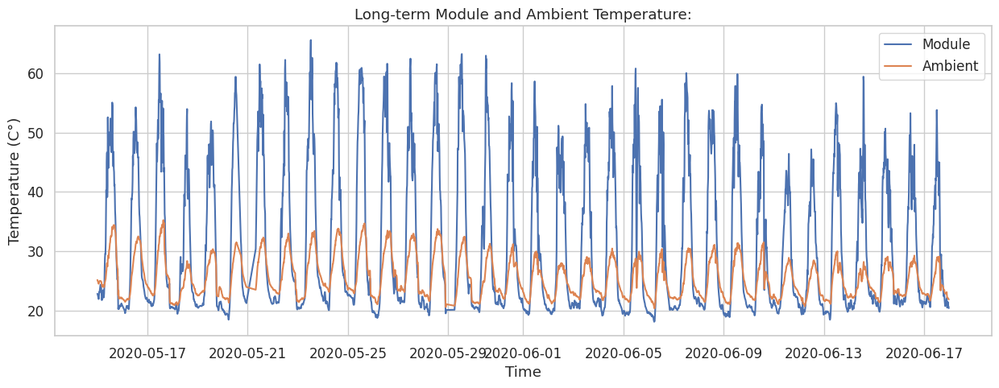

In [ ]:
plt.plot(df_solar1.DATE_TIME, df_solar1.MODULE_TEMPERATURE, label="Module")
plt.plot(df_solar1.DATE_TIME, df_solar1.AMBIENT_TEMPERATURE, label="Ambient")
plt.title("Long-term Module and Ambient Temperature:")
plt.legend()
plt.xlabel("Time")
plt.ylabel("Temperature (C°)")
plt.show()

To check the lowest and highest ambient temprature. It also helps us to compare with the module temprature.

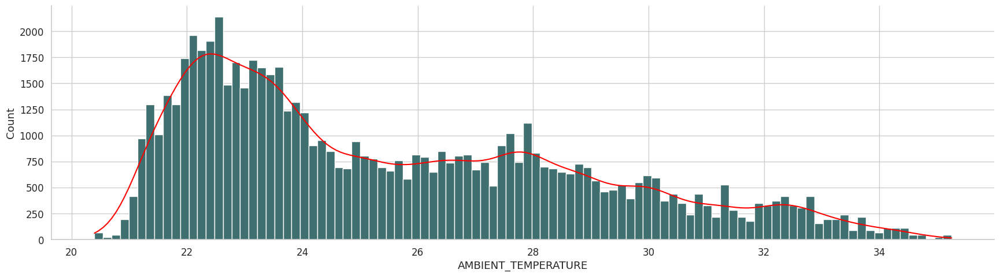

In [ ]:
sns.displot(data=df_solar1, x="AMBIENT_TEMPERATURE", kde=True, bins = 100,color = "red", facecolor = "#3F6F6F",height = 5, aspect = 3.5);

Multiple Plotting of DC_POWER generation on per day basis.

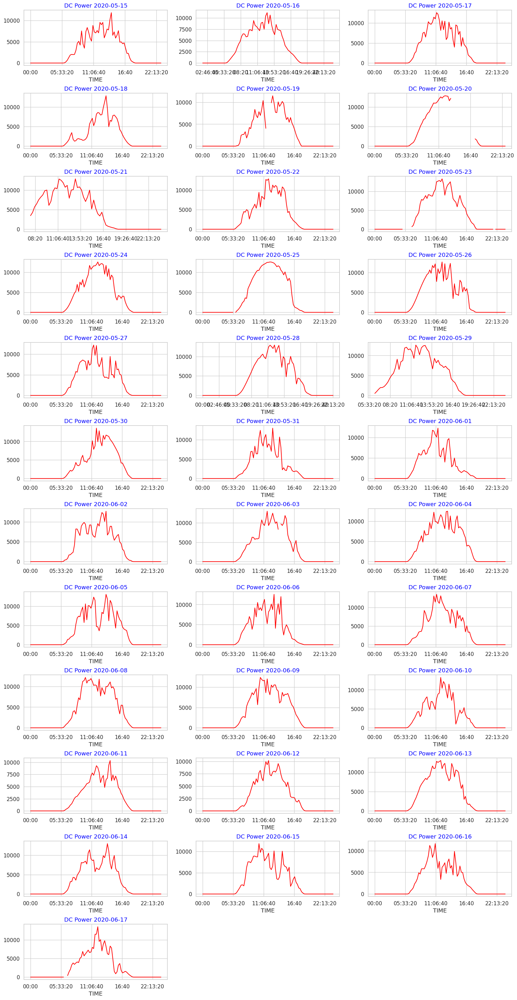

In [ ]:
solar_dc = df_solar1.pivot_table(values='DC_POWER', index='TIME', columns='DATE')

def Daywise_plot(data= None, row = None, col = None, title='DC Power'):
    cols = data.columns # take all column
    gp = plt.figure(figsize=(20,40))

    gp.subplots_adjust(wspace=0.2, hspace=0.5)
    for i in range(1, len(cols)+1):
        ax = gp.add_subplot(row,col, i)
        data[cols[i-1]].plot(ax=ax, color='red')
        ax.set_title('{} {}'.format(title, cols[i-1]),color='blue')

Daywise_plot(data=solar_dc, row=12, col=3)

Note: Reason for very high Fluctuation & Reduction in DC_POWER generation is due to fault in the system or may be fluctuation in weather or due to clouds etc. which need to be analyse further

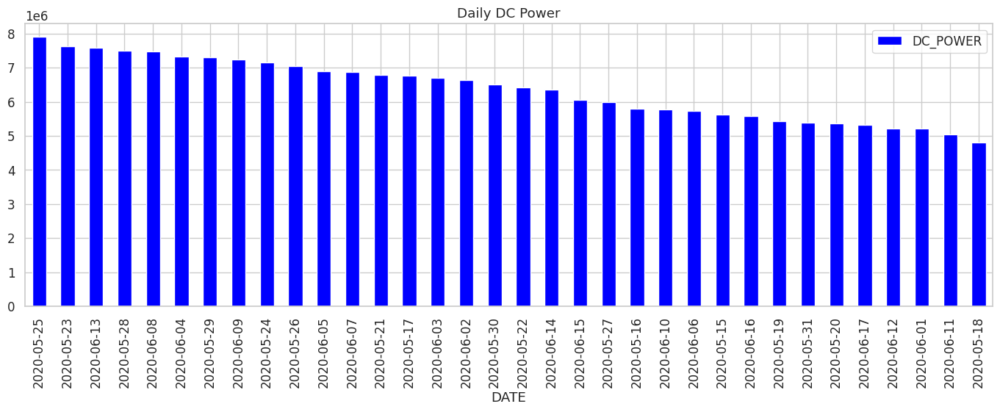

In [ ]:
daily_dc = df_solar1.groupby('DATE')['DC_POWER'].agg('sum')

ax = daily_dc.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='blue')
plt.title('Daily DC Power')
plt.show()

Multiple Plotting of IRRADIATION generation on per day basis.

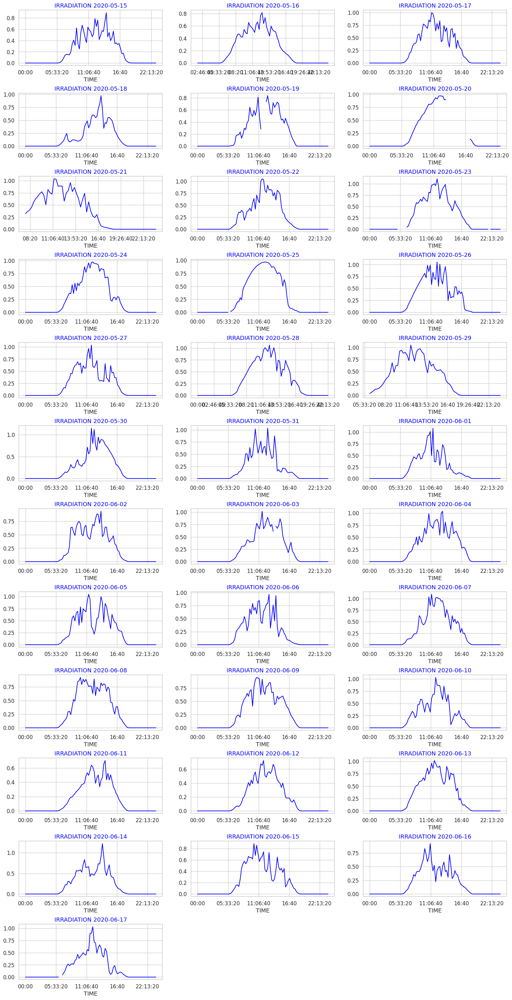

In [ ]:
solar_irradiation = df_solar1.pivot_table(values='IRRADIATION', index='TIME', columns='DATE')

def Daywise_plot(data= None, row = None, col = None, title='IRRADIATION'):
    cols = data.columns # take all column
    gp = plt.figure(figsize=(20,40))

    gp.subplots_adjust(wspace=0.2, hspace=0.5)
    for i in range(1, len(cols)+1):
        ax = gp.add_subplot(row,col, i)
        data[cols[i-1]].plot(ax=ax, color='blue')
        ax.set_title('{} {}'.format(title, cols[i-1]),color='blue')

Daywise_plot(data=solar_irradiation, row=12, col=3)

Daily Irradiation

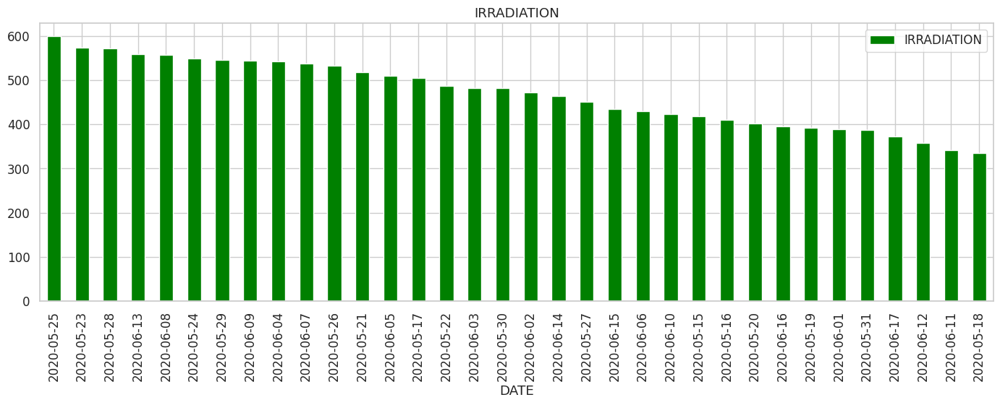

In [ ]:
daily_irradiation = df_solar1.groupby('DATE')['IRRADIATION'].agg('sum')

daily_irradiation.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='green')
plt.title('IRRADIATION')
plt.show()

Solar Ambiant Temprature

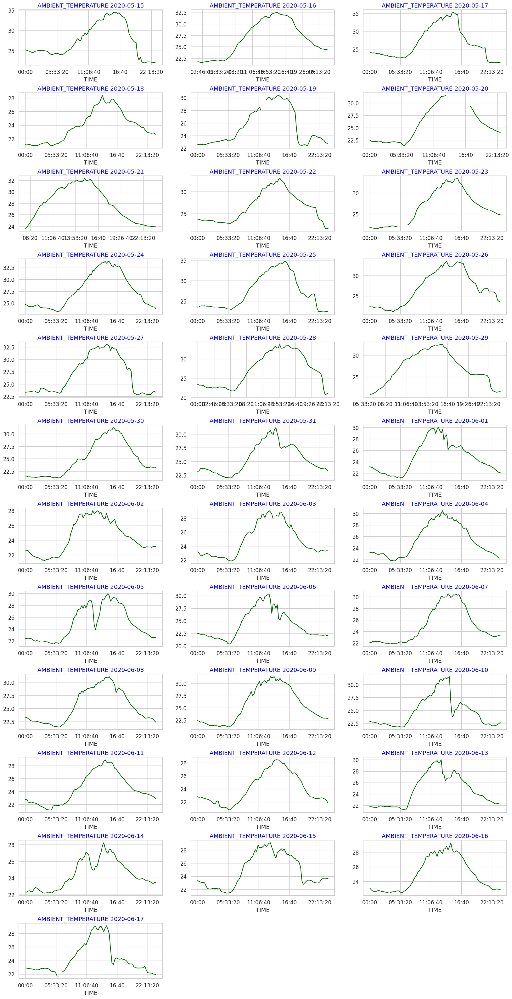

In [ ]:
solar_ambiant_temp = df_solar1.pivot_table(values='AMBIENT_TEMPERATURE', index='TIME', columns='DATE')

def Daywise_plot(data= None, row = None, col = None, title='AMBIENT_TEMPERATURE'):
    cols = data.columns # take all column
    gp = plt.figure(figsize=(20,40))

    gp.subplots_adjust(wspace=0.2, hspace=0.5)
    for i in range(1, len(cols)+1):
        ax = gp.add_subplot(row,col, i)
        data[cols[i-1]].plot(ax=ax, color='darkgreen')
        ax.set_title('{} {}'.format(title, cols[i-1]),color='blue')

Daywise_plot(data=solar_ambiant_temp, row=12, col=3)

Daily Ambiant Temprature

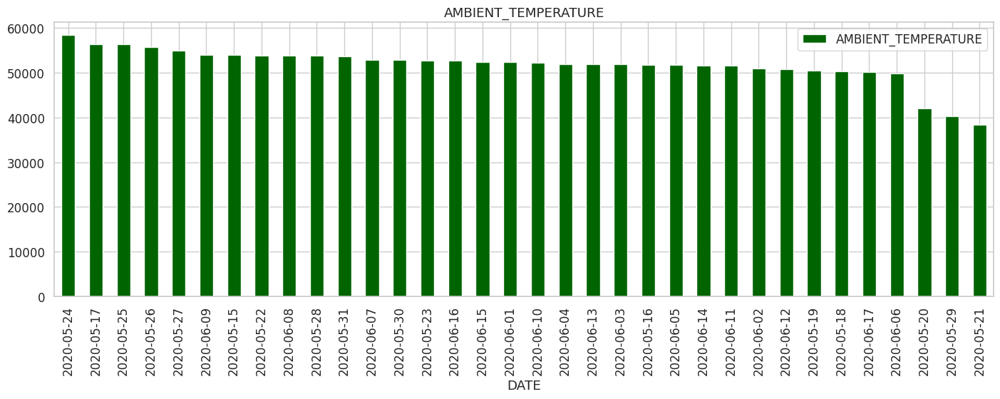

In [ ]:
daily_ambient_temp = df_solar1.groupby('DATE')['AMBIENT_TEMPERATURE'].agg('sum')

daily_ambient_temp.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='darkgreen')
plt.title('AMBIENT_TEMPERATURE')
plt.show()

Efficiency Calculation

In [ ]:
solar_dc_power = df_solar1[df_solar1['DC_POWER'] > 0]['DC_POWER'].values
solar_ac_power = df_solar1[df_solar1['AC_POWER'] > 0]['AC_POWER'].values

In [ ]:
eff = (np.max(solar_ac_power)/np.max(solar_dc_power ))*100
print(f"Power ratio AC/DC (Efficiency) of Solar Power Plant:  {eff:0.3f} %")

Power ratio AC/DC (Efficiency) of Solar Power Plant:  9.750 %


In [ ]:
AC=[]
for i in df_solar1['AC_POWER']:
    if i>0:
        AC.append(i)


In [ ]:
DC=[]
for i in df_solar1['DC_POWER']:
    if i>0:
        DC.append(i)
DC
DC.sort()
DC.reverse()

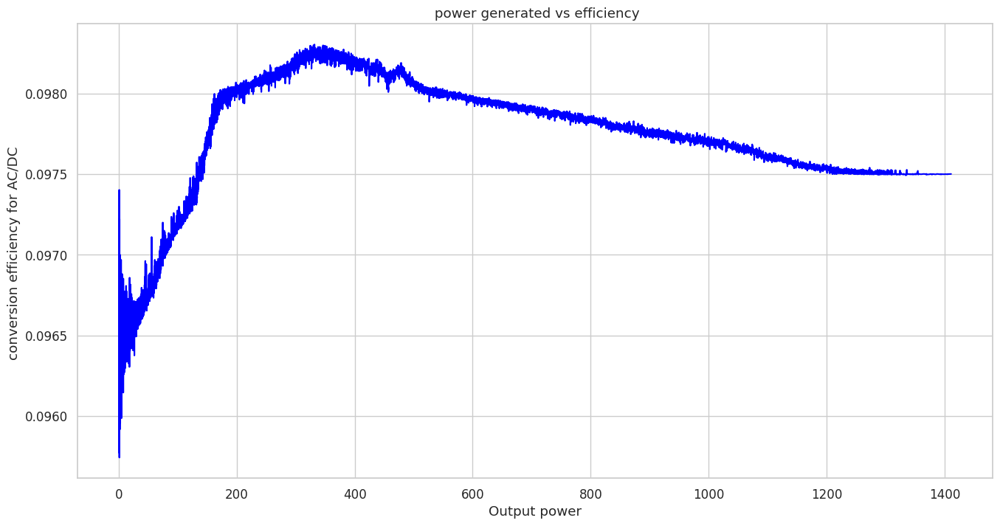

In [ ]:
plt.figure(figsize=(16,8))
AC.sort()
DC.sort()

eff_values = [i/j for i,j in zip(AC,DC)]

plt.plot(AC,eff_values,color='blue')
plt.xlabel('Output power')
plt.ylabel('conversion efficiency for AC/DC ')
plt.title(' power generated vs efficiency');

# Data Merging

In [ ]:
df_solar2 = pd.merge(generation_data_plant2.drop(columns = ['PLANT_ID']), weather_data_plant2.drop(columns = ['PLANT_ID', 'SOURCE_KEY']), on='DATE_TIME')

Merged all the datasets.

In [ ]:
df_all_plants = pd.concat([df_solar1, df_solar2])

In [ ]:
df_all_plants.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR
0,2020-05-15,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,1.0,1,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
1,2020-05-15,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2.0,2,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
2,2020-05-15,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,3.0,3,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
3,2020-05-15,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,4.0,4,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
4,2020-05-15,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0,5.0,5,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
